# Computing and subsetting to 7K svg - P5

In [1]:
import scanpy as sc
import pandas as pd
import json
import gzip

In [2]:
import numpy as np
import anndata as ad
import scipy.sparse as sp

In [3]:
import squidpy as sq

/nfs/users/nfs_m/ms83/.local/lib/python3.10/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/nfs/users/nfs_m/ms83/.local/lib/python3.10/site-packages/numba/core/decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)
/nfs/users/nfs_m/ms83/.local/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)


In [4]:
import matplotlib.pyplot as plt
import seaborn as sns

In [5]:
path = '/nfs/team361/ms83/data/CRC/visiumHD_mintflow/raw_data/'

In [6]:
adata = sc.read_h5ad(path + "adata_sc_P5_rawformintflow.h5ad")

In [7]:
adata

AnnData object with n_obs × n_vars = 252242 × 18085
    obs: 'tissue', 'X', 'Y', 'DeconvolutionClass', 'DeconvolutionLabel1', 'DeconvolutionLabel2', 'Periphery', 'UnsupervisedL1', 'UnsupervisedL2', 'MacrophageSubtype', 'GobletSubcluster', 'patient', 'patient_id'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

/nfs/users/nfs_m/ms83/.local/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


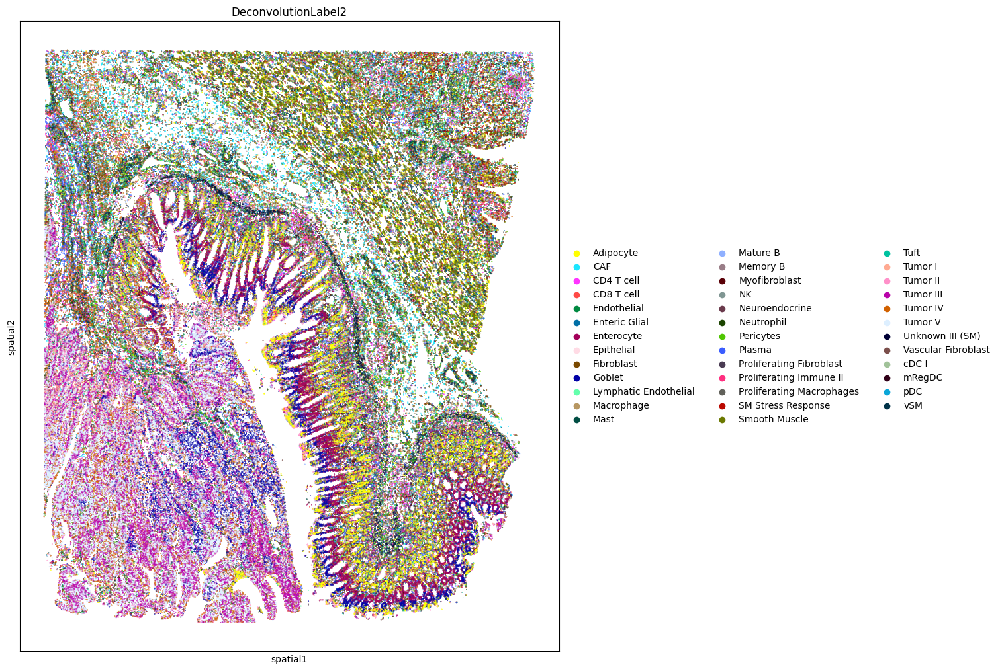

In [8]:
sq.pl.spatial_scatter(
    adata,
    library_id="spatial",
    shape=None,
    color=[
        "DeconvolutionLabel2",
    ],
    wspace=0.4,
    size=0.2,
    figsize=(15, 15)
)

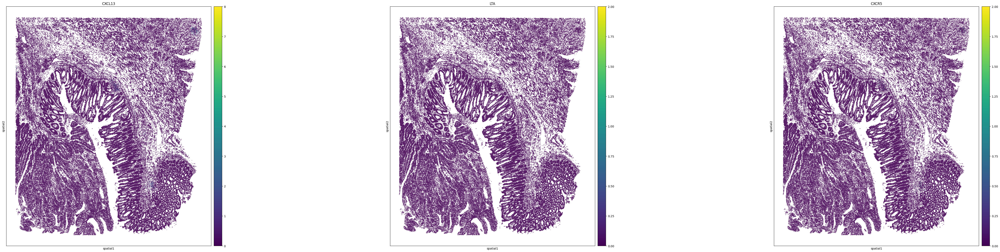

In [15]:
sq.pl.spatial_scatter(
    adata,
    library_id="spatial",
    shape=None,
    color=[
        "CXCL13", "LTA", "CXCR5",
    ],
    wspace=0.4,
    size=0.2,
    figsize=(15, 15)
)

In [16]:
adata

AnnData object with n_obs × n_vars = 252242 × 18085
    obs: 'tissue', 'X', 'Y', 'DeconvolutionClass', 'DeconvolutionLabel1', 'DeconvolutionLabel2', 'Periphery', 'UnsupervisedL1', 'UnsupervisedL2', 'MacrophageSubtype', 'GobletSubcluster', 'patient', 'patient_id'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial', 'DeconvolutionLabel2_colors'
    obsm: 'spatial'

In [17]:
adata.layers["counts"] = adata.X.copy()
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.pca(adata)

In [18]:
sc.pp.neighbors(adata)
sc.tl.umap(adata)

In [19]:
sq.gr.spatial_neighbors(adata, coord_type="generic", delaunay=True)

In [20]:
sq.gr.centrality_scores(adata, cluster_key="DeconvolutionLabel2")

/nfs/users/nfs_m/ms83/.local/lib/python3.10/site-packages/IPython/core/events.py:82: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or Axes decorations smaller.
  func(*args, **kwargs)
/nfs/users/nfs_m/ms83/.local/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or Axes decorations smaller.
  fig.canvas.print_figure(bytes_io, **kw)


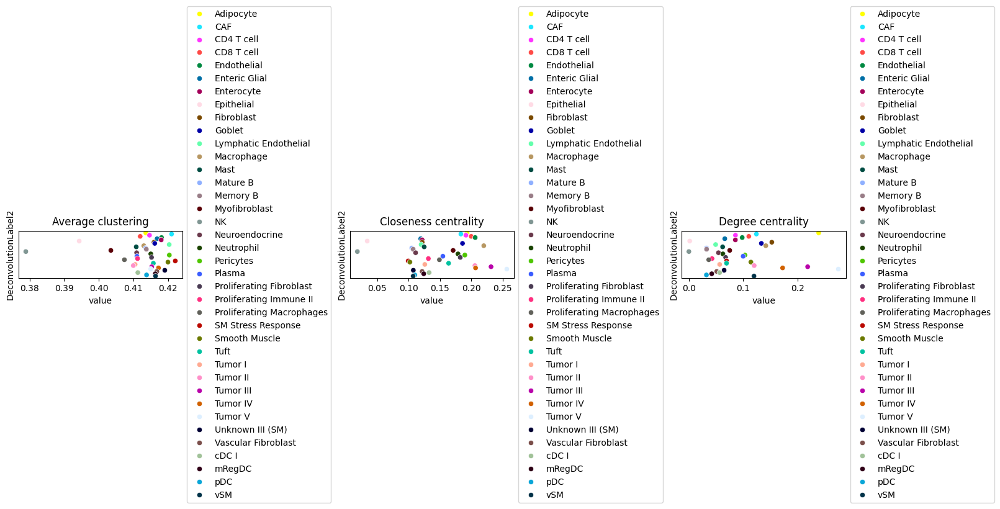

In [21]:
sq.pl.centrality_scores(adata, cluster_key="DeconvolutionLabel2", figsize=(16, 5))

In [22]:
adata_subsample = sc.pp.subsample(adata, fraction=0.5, copy=True)

  0%|          | 0/1953 [00:00<?, ?/s]

/nfs/users/nfs_m/ms83/.local/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/nfs/users/nfs_m/ms83/.local/lib/python3.10/site-packages/IPython/core/events.py:82: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or Axes decorations smaller.
  func(*args, **kwargs)
/nfs/users/nfs_m/ms83/.local/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or Axes decorations smaller.
  fig.canvas.print_figure(bytes_io, **kw)


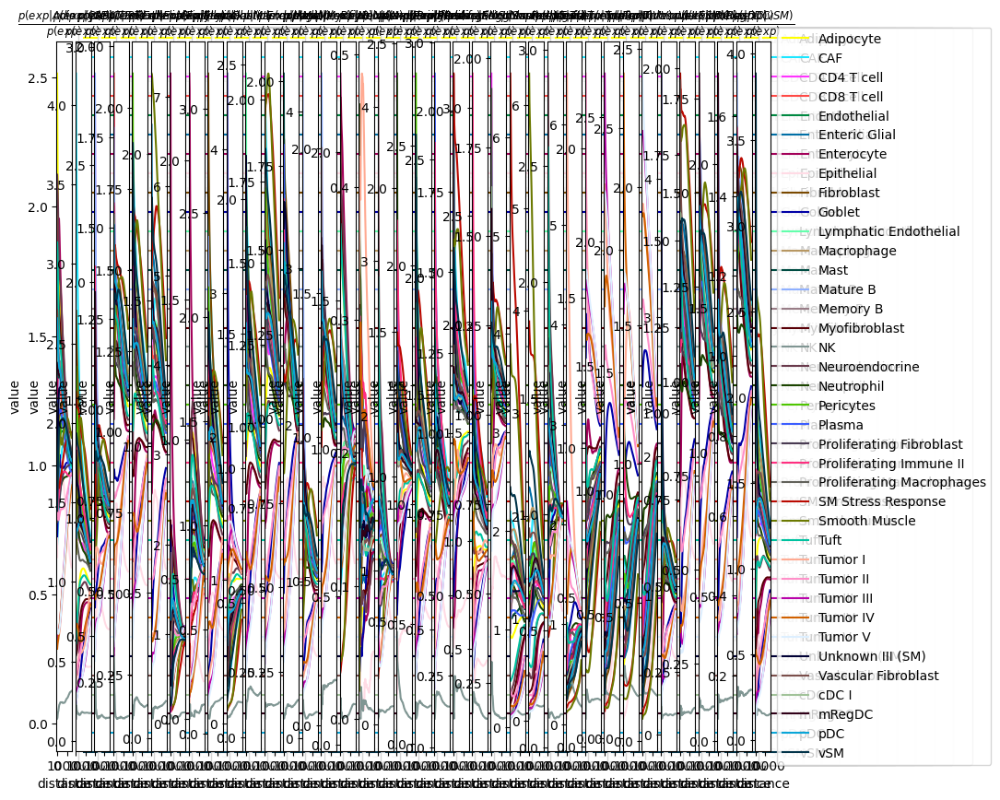

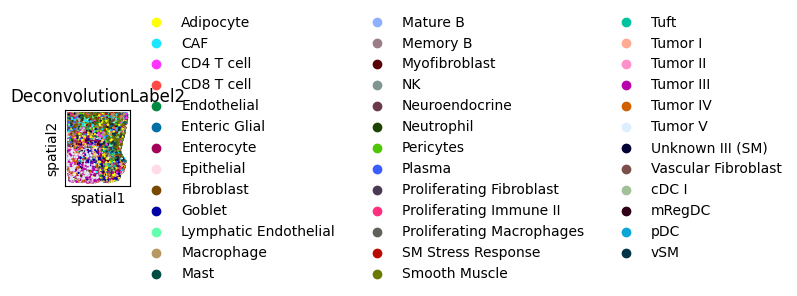

In [23]:
sq.gr.co_occurrence(
    adata_subsample,
    cluster_key="DeconvolutionLabel2",
)
sq.pl.co_occurrence(
    adata_subsample,
    cluster_key="DeconvolutionLabel2",
    #clusters="12",
    figsize=(10, 10),
)
sq.pl.spatial_scatter(
    adata_subsample,
    color="DeconvolutionLabel2",
    shape=None,
    size=2,
)

/nfs/users/nfs_m/ms83/.local/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/nfs/users/nfs_m/ms83/.local/lib/python3.10/site-packages/IPython/core/events.py:82: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or Axes decorations smaller.
  func(*args, **kwargs)
/nfs/users/nfs_m/ms83/.local/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or Axes decorations smaller.
  fig.canvas.print_figure(bytes_io, **kw)


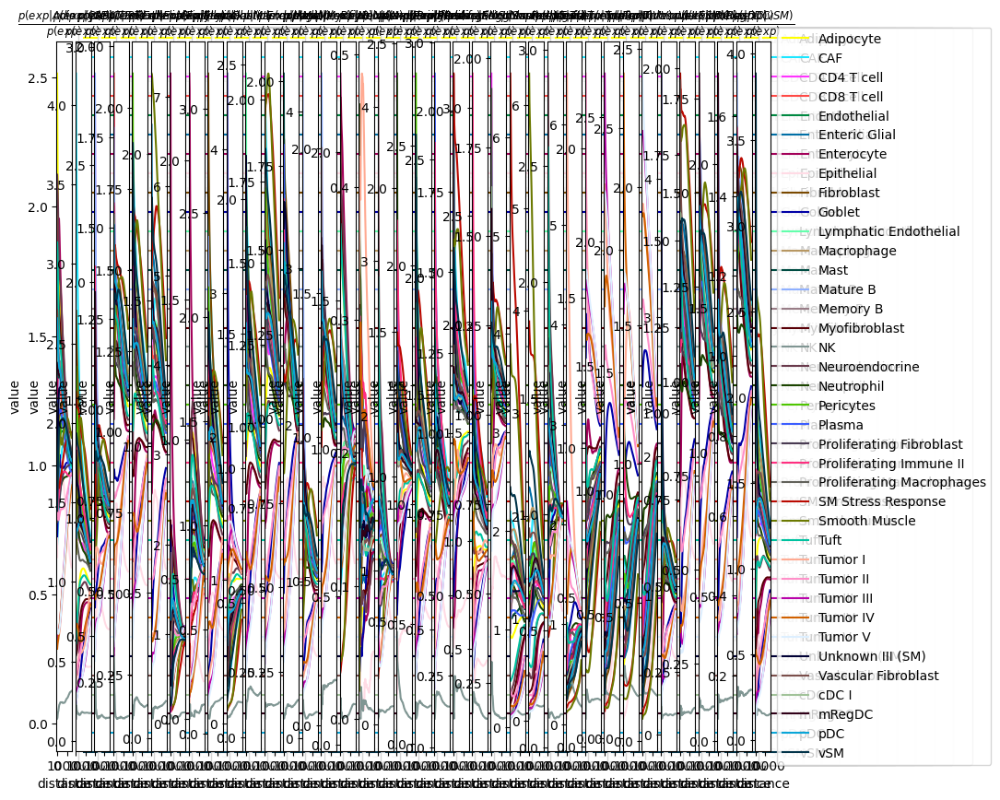

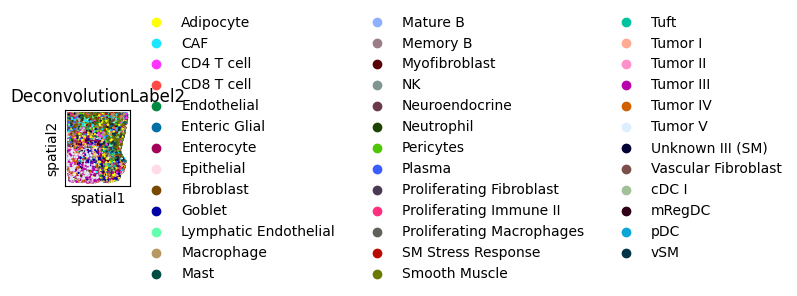

In [24]:
sq.pl.co_occurrence(
    adata_subsample,
    cluster_key="DeconvolutionLabel2",
    #clusters="12",
    figsize=(10, 10),
)
sq.pl.spatial_scatter(
    adata_subsample,
    color="DeconvolutionLabel2",
    shape=None,
    size=2,
)

In [ ]:
sq.gr.nhood_enrichment(adata, cluster_key="DeconvolutionLabel2")

  0%|          | 0/1000 [00:00<?, ?/s]

/nfs/users/nfs_m/ms83/.local/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


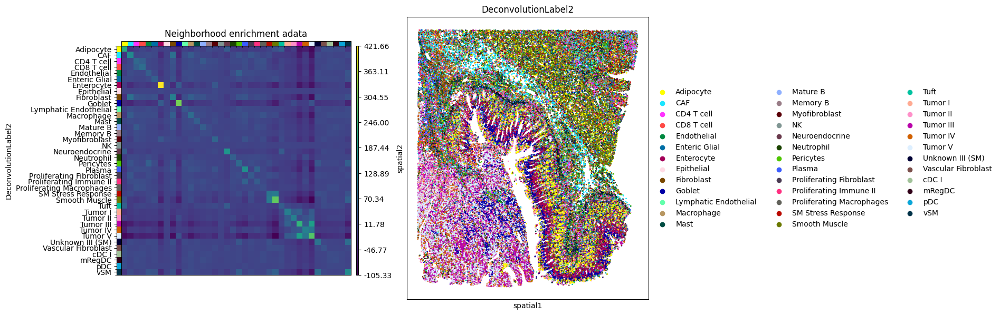

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(13, 7))
sq.pl.nhood_enrichment(
    adata,
    cluster_key="DeconvolutionLabel2",
    figsize=(8, 8),
    title="Neighborhood enrichment adata",
    ax=ax[0],
)
sq.pl.spatial_scatter(adata_subsample, color="DeconvolutionLabel2", shape=None, size=2, ax=ax[1])

In [ ]:
sq.gr.spatial_neighbors(adata_subsample, coord_type="generic", delaunay=True)
sq.gr.spatial_autocorr(
    adata_subsample,
    mode="moran",
    n_perms=100,
    n_jobs=1,
)
adata_subsample.uns["moranI"].head(10)

/nfs/users/nfs_m/ms83/.local/lib/python3.10/site-packages/scanpy/metrics/_common.py:62: UserWarning: 36 variables were constant, will return nan for these.
  warnings.warn(


  0%|          | 0/100 [00:00<?, ?/s]

In [ ]:
adata

In [ ]:
adata_subsample

In [ ]:
moran_res = adata_subsample.uns["moranI"]
moran_res

In [ ]:
moran_res_sorted = moran_res.sort_values("I", ascending=False)
moran_res_sorted

In [ ]:
import anndata as ad
import numpy as np
import scipy.sparse as sp

# Step 1: Get top 7000 genes (you already have this)
moran_res = adata_subsample.uns['moranI']
moran_res_sorted = moran_res.sort_values("I", ascending=False)
top_genes = moran_res_sorted.head(7000).index.tolist()

print(f"Selected {len(top_genes)} top SVGs")

# Step 2: Subset the original AnnData by top genes
adata_svg = adata[:, top_genes].copy()

print(f"Original shape: {adata.shape}")
print(f"Subsetted shape: {adata_svg.shape}")

# Step 3: Set up for MintFlow with proper format
# Get raw counts (adjust based on where yours are stored)
if hasattr(adata_svg, 'raw') and adata_svg.raw is not None:
    raw_counts = adata_svg.raw[:, top_genes].X
elif 'counts' in adata_svg.layers:
    raw_counts = adata_svg.layers['counts']
else:
    raw_counts = adata_svg.X

# Convert to sparse CSR matrix with int64 dtype
if sp.issparse(raw_counts):
    X_int64 = raw_counts.astype(np.int64)
    if not sp.isspmatrix_csr(X_int64):
        X_int64 = sp.csr_matrix(X_int64)
else:
    X_int64 = sp.csr_matrix(raw_counts.astype(np.int64))

# Create new AnnData with MintFlow-compatible format
adata_mintflow = ad.AnnData(
    X=X_int64,
    obs=adata_svg.obs.copy(),
    var=adata_svg.var.copy(),
    obsm=adata_svg.obsm.copy(),
    uns=adata_svg.uns.copy()
)

# Set raw attribute (required by MintFlow)
adata_mintflow.raw = adata_mintflow.copy()

# Verify the setup
print("\n=== MintFlow AnnData verification ===")
print(f"Shape: {adata_mintflow.shape}")
print(f"X dtype: {adata_mintflow.X.dtype}")
print(f"X is sparse: {sp.issparse(adata_mintflow.X)}")
print(f"X format: {type(adata_mintflow.X).__name__}")
print(f"Has raw: {adata_mintflow.raw is not None}")
print(f"Spatial coords present: {'spatial' in adata_mintflow.obsm}")
if sp.issparse(adata_mintflow.X):
    print(f"Sparse format: {adata_mintflow.X.format}")

# Save
adata_mintflow.write_h5ad(path + "adata_sc_P5_rawformintflow_7K_svg.h5ad")
print("\nSaved to:", path + "adata_sc_P5_rawformintflow_7K_svg.h5ad")

In [ ]:
adata.obs.X

In [ ]:
np.max(np.array(adata.obs.X.tolist())) - np.min(np.array(adata.obs.X.tolist()))

In [ ]:
np.max(np.array(adata.obs.Y.tolist())) - np.min(np.array(adata.obs.Y.tolist()))

In [37]:
adata

AnnData object with n_obs × n_vars = 252242 × 18085
    obs: 'tissue', 'X', 'Y', 'DeconvolutionClass', 'DeconvolutionLabel1', 'DeconvolutionLabel2', 'Periphery', 'UnsupervisedL1', 'UnsupervisedL2', 'MacrophageSubtype', 'GobletSubcluster', 'patient', 'patient_id'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial', 'DeconvolutionLabel2_colors', 'log1p', 'pca', 'neighbors', 'umap', 'spatial_neighbors', 'DeconvolutionLabel2_centrality_scores', 'DeconvolutionLabel2_nhood_enrichment'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities', 'spatial_connectivities', 'spatial_distances'